# Stock Clustering

In this notebook, we'll try to cluster the defined universe of stocks based on a combination of their historical financial ratios and their business descriptions gathered from prominent financial data sources.

1. We'll fetch historical financial ratios for all stocks from fiscal year 2010 to fiscal year 2022 - clean & preprocess data (data imputation), feature extraction from historical ratios data (dimensionality reduction) & finally data transformation

2. We'll fetch business descriptions (textual data) for all stocks from AlphaVantage - clean & preprocess data (remove stopwords, stemming/lemmatisation), text vectorisation (TFIDF -> LSA), feature engineering and data transformation 

3. Merge all features extracted from both the pre-processing methods and create a single uncorrelated feature space for model fitting

4. We'll explore various clustering models and fit these models on the preprocessed and transformed dataset - model fitting, hyper-parameter tuning

5. We'll evaluate the performance of all the models in consideration - intrinsic evaluation measures

6. Pick the best model to fit the data - fit it on the data and retrieve cluster labels for all observations (stocks)

---

In [1]:
import pandas as pd
import numpy as np
import datetime as dt
from collections import Counter
pd.set_option('display.max_rows', 2000)
pd.set_option('display.max_columns', 1000)
pd.set_option('display.width', 1000)

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import colorcet as cc
sns.set(style="white", rc={"figure.figsize":(8, 4)})
plt.style.use('ggplot') # fivethirtyeight, ggplot, dark_background, classic,  

from sklearn.preprocessing import StandardScaler, Normalizer, MinMaxScaler
from sklearn import feature_extraction
from sklearn.decomposition import TruncatedSVD, PCA
from sklearn.cluster import KMeans, OPTICS, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.manifold import TSNE
from sklearn.impute import KNNImputer
from scipy.spatial.distance import pdist, cdist

from kneed import KneeLocator
import re
import nltk
# nltk.download('stopwords') # required to be downloaded only for the first time
# nltk.download('wordnet') # required to be downloaded only for the first time
# nltk.download('omw-1.4') # required to be downloaded only for the first time
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
from wordcloud import WordCloud

import warnings
warnings.filterwarnings("ignore")

---

### Generic Util functions

These are generic util functions which could be reused for any of the tasks across sections

In [2]:
def std_normalise_data(data = pd.DataFrame()):
    """
    Standard scaling and Normalisation of input data

    Parameters:
    -----------
    data : pd.DataFrame
            raw data

    Returns: 
    --------
    new_df : pd.DataFrame
            scaled data
    """
    new_data = StandardScaler().fit_transform(data)
    new_data = Normalizer().fit_transform(new_data) 
    new_df = pd.DataFrame(new_data, index=data.index, columns=data.columns)
    return new_df

def knn_imputer(data: pd.DataFrame, n_neighbours: int=30):
    """
    Data imputation with KNNImputer

    Parameters:
    -----------
    data : pd.DataFrame
            raw data that needs to be imputed to handle missing values.

    n_neighbours : int, default value is 30
            Number of neighboring samples to use for imputation.

    Returns: 
    --------
    new_df : pd.DataFrame
            imputed data with zero NaN values.
    """
    # scale the data using minmaxscaler
    scaled_data = MinMaxScaler(feature_range=(0, 1)).fit_transform(data)
    # Define KNN imputer and fill missing values
    knn_fit_data = KNNImputer(n_neighbors=n_neighbours, weights='distance').fit_transform(scaled_data)
    new_df = pd.DataFrame(knn_fit_data, columns=data.columns, index=data.index)

    # check if there are any more missing values after imputation
    print(f'Total count of missing values before imputing with KNNImputer: {data.isna().sum().sum()}')
    print(f'Total count of missing values after imputing with KNNImputer: {new_df.isna().sum().sum()}')
    return new_df

def pca_tuning(data = pd.DataFrame()):
    """
    PCA tuning - dimensionality reduction

    method 1 - Plot the cummulative explained variance against the count of principal components
    
    method 2 - Create a 'Scree' plot which gives the visual representation of eigenvalues 
    that define the magnitude of eigenvectors (principal components)

    Parameters:
    -----------
    data : pd.DataFrame
            data on which to fit the PCA model

    Returns: 
    --------
    pca_base : PCA object
            Fitted PCA model object

    knee_value : int
            computed Knee point from the Scree plot        
    """
    # Start with basic PCA, keeping all components with no reduction   
    pca_base = PCA()
    pca_base.fit(data)

    plt.figure(figsize=(12, 6))
    # Method 1
    # Fetch variance explained by each individual component & compute the cummulative sum
    print('Method 1 - variance explained by components') 
    plt.subplot(1, 2, 1)
    exp_var = pca_base.explained_variance_ratio_ * 100
    cum_exp_var = np.cumsum(exp_var)
    plt.bar(range(0, exp_var.size), exp_var, align='center', label='Individual explained variance (%)')
    plt.step(range(0, cum_exp_var.size), cum_exp_var, where='mid', label='Cumulative explained variance (%)', color='indigo')
    plt.ylabel('Explained variance (%)')
    plt.xlabel('Principal component index')
    plt.legend(loc='best')

    # Method 2 - Scree plot
    print('\nMethod 2 - Scree plot')
    plt.subplot(1, 2, 2)
    plt.plot(np.arange(pca_base.n_components_) + 1, pca_base.explained_variance_, 'ro-', linewidth=2,  color='orange')
    knee = KneeLocator(np.arange(pca_base.n_components_) + 1, pca_base.explained_variance_, S=20, 
                       curve='convex', direction='decreasing', interp_method='interp1d')
    plt.axvline(x=knee.knee, ymax=0.95, ymin=0.05, color='brown', ls='--')
    plt.figtext(0.65, 0.4, f'optimal n_comp = {knee.knee}', bbox=dict(facecolor='violet', alpha=0.3), fontsize=10)
    plt.title("Scree Plot")
    plt.xlabel("Principal component index")
    plt.ylabel("Eigenvalues")
    print(f'Knee point, eigenvalue : {knee.knee, pca_base.explained_variance_[knee.knee]}')
    plt.tight_layout(pad=2.0)
    plt.show()

    return pca_base, knee.knee

---

### 1. Historical Financial Ratios dataset

In [3]:
stock_ratios_df = pd.read_csv('../data/stocks_hist_ratios.csv')
print(f'Total count of stocks in hist ratios data: {len(stock_ratios_df.ticker.unique())}') 
stock_ratios_df.head()

Total count of stocks in hist ratios data: 502


,ticker,Fiscal Date Ending,Current ratio,Quick ratio,Cash ratio,Days of sales outstanding,Days of inventory outstanding,Operating cycle,Days of payables outstanding,Cash conversion cycle,Gross profit margin,Operating profit margin,Pretax profit margin,Net profit margin,Effective tax rate,Return on assets,Return on equity,Return on capital employed,Net income per EBT,Ebt per ebit,Ebit per revenue,Debt ratio,Debt equity ratio,Long term debt to capitalization,Total debt to capitalization,Cash flow to debt ratio,Company equity multiplier,Receivables turnover,Payables turnover,Inventory turnover,Fixed asset turnover,Asset turnover,Operating cash flow per share,Free cash flow per share,Cash per share,Payout ratio,Operating cash flow sales ratio,Free cash flow operating cash flow ratio,Cash flow coverage ratios,Short term coverage ratios,Capital expenditure coverage ratio,Dividend paid and capex coverage ratio,Dividend payout ratio,Price book value ratio,Price to book ratio,Price to sales ratio,Price earnings ratio,Price to free cash flows ratio,Price to operating cash flows ratio,Price cash flow ratio,Price earnings to growth ratio,Price sales ratio,Dividend yield,Enterprise value multiple,Price fair value,Interest coverage
0,MMM,2010,2.006,1.344,0.555,50.748,83.260,134.009,43.860,90.149,0.481,0.222,0.216,0.153,0.277,0.135,0.261,0.246,0.710,0.972,0.222,0.469,0.903,0.211,0.258,0.949,1.925,7.192,8.322,4.384,3.663,0.884,7.250,5.721,6.274,0.367,0.194,0.789,0.949,4.077,-4.742,12.650,0.367,3.984,3.984,2.341,15.277,15.284,12.061,12.061,0.601,2.341,0.024,10.970,3.984,NaN
1,MMM,2011,2.250,1.407,0.408,49.010,79.452,128.462,38.214,90.248,0.470,0.209,0.204,0.145,0.278,0.135,0.278,0.236,0.710,0.976,0.209,0.498,1.022,0.225,0.251,1.023,2.050,7.447,9.551,4.594,3.863,0.937,7.458,5.512,5.194,0.363,0.178,0.739,1.023,7.748,-3.832,30.023,0.363,4.013,4.013,2.090,14.448,15.846,11.711,11.711,2.504,2.090,0.025,10.553,4.013,NaN
2,MMM,2012,2.198,1.406,0.465,51.093,89.289,140.383,53.011,87.372,0.475,0.217,0.212,0.149,0.290,0.131,0.253,0.234,0.700,0.980,0.217,0.467,0.901,0.219,0.255,0.883,1.928,7.144,6.885,4.088,3.569,0.883,7.638,5.499,6.53,0.368,0.177,0.720,0.883,4.885,-3.571,35.099,0.368,3.980,3.980,2.339,15.739,18.329,13.197,13.197,2.721,2.339,0.023,9.436,3.980,NaN
3,MMM,2013,1.698,1.025,0.344,51.455,87.567,139.023,53.166,85.857,0.478,0.216,0.213,0.151,0.281,0.139,0.266,0.256,0.710,0.984,0.216,0.465,0.891,0.198,0.256,0.968,1.917,7.094,6.865,4.168,3.568,0.92,8.531,6.089,4.894,0.371,0.188,0.714,0.968,3.456,-3.494,89.492,0.371,4.989,4.989,2.828,18.742,21.030,15.011,15.011,2.789,2.828,0.020,11.321,4.989,NaN
4,MMM,2014,1.961,1.14,0.316,49.495,82.245,131.740,51.930,79.810,0.483,0.224,0.221,0.156,0.289,0.158,0.378,0.282,0.705,0.985,0.224,0.58,1.383,0.339,0.343,0.969,2.385,7.375,7.029,4.438,3.748,1.018,10.206,7.907,3.886,0.447,0.208,0.775,0.969,62.509,-4.438,9.165,0.447,8.038,8.038,3.311,21.260,20.527,15.902,15.902,1.815,3.311,0.021,12.925,8.038,NaN


In [4]:
target_ratios = ['Quick ratio', 'Cash ratio', 'Interest coverage', 'Debt equity ratio', 'Asset turnover', 'Receivables turnover', 'Return on assets', 
                 'Operating profit margin', 'Enterprise value multiple', 'Payout ratio']

--------------------------------------------------
Data Imputation

Total count of missing values before imputing with KNNImputer: 6705
Total count of missing values after imputing with KNNImputer: 0
--------------------------------------------------
PCA for Dimensionality Reduction

Method 1 - variance explained by components

Method 2 - Scree plot
Knee point, eigenvalue : (12, 0.063552245)


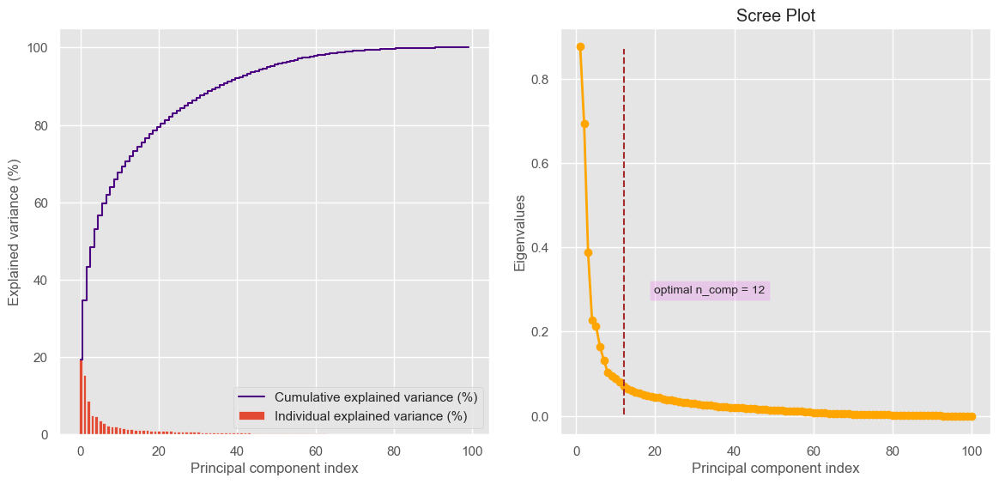

--------------------------------------------------
Fit a new PCA with n_components = 12 as observed from the Scree plot


In [5]:
def clean_preprocess_ratios_data(raw_data: pd.DataFrame, target_date_range: range=range(2010, 2020), copy: bool=True,
                                 target_ratios: list=target_ratios):
    """
    Perform data cleaning and preprocessing
    on raw historical financial ratios dataset.

    Parameters:
    -----------
    raw_data : pd.DataFrame
        large single dataframe of historical ratios for all the stocks.

    target_date_range : range
        range of fiscal years to be considered for fetching annual historical ratios measures.
        It's a range of years which includes the first value but not the last value. 

    copy : bool, default value is True
        If set to True, all processing will be done on a copy of the input raw data. 
        Else, the input raw data will be modified.
    
    target_ratios : list, default list of desired targets defined
        The list of specific ratios to be considered as the target feature set for model fitting. 

    Returns: 
    --------
    ratios_final_df : pd.DataFrame
        cleaned and processed dataframe of target historical ratio measures within the specified date range.
    """
    
    if copy:
        raw_data = raw_data.copy()
    # reshuffling DF into a pivot DF
    pivot_df = raw_data[['ticker', 'Fiscal Date Ending'] + target_ratios].pivot(
        index='ticker', columns='Fiscal Date Ending', values=target_ratios)
    # change the dtypes from object to float
    pivot_df = pivot_df.apply(pd.to_numeric, errors='coerce', downcast='float')
    # filter data only within the target date range
    target_df = pivot_df[[col_tup for col_tup in pivot_df.columns if col_tup[1] in target_date_range]]

    # data imputation of missing values
    # From our EDA, we found KNNImputer works the best on this data for n_neighbours=30
    print('-'*50)
    print('Data Imputation\n')
    target_imp_df = knn_imputer(target_df, n_neighbours=30)

    # PCA - dimensionality reduction
    # standard scaling and normalisation before fitting PCA
    print('-'*50)
    print('PCA for Dimensionality Reduction\n')
    scaled_df = std_normalise_data(target_imp_df)
    # Tune a default PCA model and find optimal n_components for fitting a PCA
    # Note: PCA needs the input data to be in (n_features, n_samples) format
    # for it to function properly and reduce the feature dimensionality
    pca_base, knee_value = pca_tuning(scaled_df.T)
    print('-'*50)
    print(f'Fit a new PCA with n_components = {knee_value} as observed from the Scree plot')
    # Fit a new PCA model with the obtained hyperparam value testing
    pca_final = PCA(n_components=knee_value)
    pca_final.fit(scaled_df.T) # Note: we need to input data in the exact required format here for the PCA to work properly

    # Structure the final results in a dataframe
    ratios_final_df = pd.DataFrame(pca_final.components_.T, index=scaled_df.index, columns=[f'PC_{i}' for i in 
                                                                                            range(pca_final.components_.T.shape[1])])
    
    return ratios_final_df

# clean and preprocess the stock ratios data
ratios_pp_df = clean_preprocess_ratios_data(stock_ratios_df)

In [6]:
ratios_pp_df.head()

,PC_0,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,PC_10,PC_11
ticker,,,,,,,,,,,,
A,-0.022969,0.019944,0.084419,0.011150,0.067873,-0.007958,0.017914,0.032608,-0.052358,0.013925,-0.007863,-0.028380
AAL,0.013973,-0.002227,0.000059,0.041342,-0.042329,0.014669,0.054968,-0.009224,0.009378,-0.001373,-0.021880,0.023775
AAP,0.073184,-0.003852,-0.067580,0.014467,-0.020870,-0.080245,-0.020355,0.017714,-0.047374,-0.010692,0.011751,-0.004874
AAPL,0.003832,0.097813,0.023741,-0.052072,-0.038252,-0.043806,0.009957,0.039997,-0.003710,0.019105,0.032649,-0.006605
ABBV,-0.039130,0.052739,0.017156,-0.010370,0.039300,0.021691,0.058346,0.017479,-0.002972,-0.011257,-0.022141,-0.092061


In [7]:
# ratios_pp_df.describe(include='all')

---

### 2. Business descriptions data for S&P 500 companies

In [8]:
sp500_stocks_profile_df = pd.read_csv('../data/stocks_profile.csv')
print(f'Total count of stocks in profile dataset: {len(sp500_stocks_profile_df.ticker.unique())}') 
sp500_stocks_profile_df.head()

Total count of stocks in profile dataset: 503


,ticker,company_name,sector,sub_industry,hq,date_added,cik,founded,business_desc
0,MMM,3M,Industrials,Industrial Conglomerates,"Saint Paul, Minnesota",1957-03-04,66740,1902,The 3M Company is an American multinational co...
1,AOS,A. O. Smith,Industrials,Building Products,"Milwaukee, Wisconsin",2017-07-26,91142,1916,A. O. Smith Corporation is an American manufac...
2,ABT,Abbott,Health Care,Health Care Equipment,"North Chicago, Illinois",1957-03-04,1800,1888,Abbott Laboratories is an American multination...
3,ABBV,AbbVie,Health Care,Pharmaceuticals,"North Chicago, Illinois",2012-12-31,1551152,2013 (1888),AbbVie is an American publicly traded biopharm...
4,ACN,Accenture,Information Technology,IT Consulting & Other Services,"Dublin, Ireland",2011-07-06,1467373,1989,Accenture plc is an Irish-domiciled multinatio...


In [9]:
def text_cleaning(text: str, flg_stemm=False, flg_lemm=True):
    """
    Clean & preprocess input string data. (remove stop words from the text, stemming/lemmatisation)

    Parameters:
    -----------
    text : str
        Textual data of string type.

    flg_stemm : bool, default is False
        Flag to indicate whether stemming should be performed on the input text.
        Note: You should not set both flg_stemm & flg_lemm to be True. Only one of them can be True at a time.

    flg_lemm : bool, default value is True
        Flag to indicate whether lemmatisation should be performed on the input text.
        Note: You should not set both flg_stemm & flg_lemm to be True. Only one of them can be True at a time.

    Returns: 
    --------
    text : str
        cleaned and processed string (removed stop words, stemming/lemmatisation).
    """
    # clean (convert to lowercase and remove punctuations and special characters and then strip)
    text = re.sub(r'[^\w\s]', '', str(text).lower().strip())
    # Tokenize (convert from string to list)
    tokens = text.split()
    # remove Stopwords
    stop_words.extend(['founded', 'firm', 'company', 'llc', 'inc', 'incorporated', 
                       'multinational', 'corporation', 'commonly', 'headquartered']) # extend the default list by adding more non-important words
    if stop_words is not None:
        tokens = [word for word in tokens if word not in stop_words]
    # Stemming (remove -ing, -ly, ...)
    if flg_stemm == True:
        ps = nltk.stem.porter.PorterStemmer()
        tokens = [ps.stem(word) for word in tokens]
    # Lemmatisation (convert the word into root word)
    if flg_lemm == True:
        lem = nltk.stem.wordnet.WordNetLemmatizer()
        tokens = [lem.lemmatize(word) for word in tokens]
            
    # back to string from list
    text = ' '.join(tokens)
    return text


def preprocess_bus_desc_data(raw_data: pd.DataFrame, copy: bool=True, n_topics: int=150):
    """
    Perform data cleaning and preprocessing
    on raw historical financial ratios dataset.

    Parameters:
    -----------
    raw_data : pd.DataFrame
        Dataframe containing stock tickers and their respective business descriptions.

    copy : bool, default value is True
        If set to True, all processing will be done on a copy of the input raw data. 
        Else, the input raw data will be modified.

    n_topics : int, default value is 150
        number of topics to be deduced from LSA.

    Returns: 
    --------
    document_topic_df : pd.DataFrame
        DF containing Document-topic matrix values.

    word_topic_df : pd.DataFrame
        DF containing Word-topic matrix values.

    sing_topic_df : pd.DataFrame
        DF containing singular matrix values.  
    """
    
    if copy:
        raw_data = raw_data.copy()
        
    # drop tickers with missing values in business_desc column only
    print('-'*50)
    print('Drop stocks with missing business description data since this forms the bedrock of feature creation\n')
    raw_data.dropna(axis=0, subset=['business_desc'], inplace=True)
    print(f'Total stocks in consideration after dropping the ones with missing business descriptions: {raw_data.shape[0]}') 
    # perform text cleaning to get rid of stopwords, apply stemming/lemmatisation rules
    print('-'*50)
    print('Carry out text cleaning which includes - removing stopwords, stemming & lemmatisation\n')
    raw_data['bd_clean'] = raw_data['business_desc'].apply(lambda txt: text_cleaning(txt))
    print(f'Total count of unique words (unigrams) found in our corpus of business descriptions across all stocks: \
      {len(set([ele for arr in list(raw_data["bd_clean"].apply(lambda x: str(x).split(" "))) for ele in arr]))}')
    # Vectorise the textual data using TF-IDF method and get a sparse DTM on the cleaned data (tuning the Tf-Idf hyperparams min_df, max_df & ngram_range)
    print('-'*50)
    print('Vectorise cleaned text data using TF-IDF method, get a sparse DTM - improve vectorisation with appropriate hyperparam values\n')
    tfidf = feature_extraction.text.TfidfVectorizer(stop_words='english', max_features=10000, min_df=1, max_df=0.1,
                                                strip_accents='unicode', ngram_range=(2,4))
    tfidf_sparse = tfidf.fit_transform(raw_data['bd_clean'])
    tfidf_features = tfidf.get_feature_names_out().tolist()
    # let's see some features which were extracted by Tf-Idf
    print(f'TF-IDF feature names (a few samples): \n{tfidf_features[-100:]}\n')

    # Apply LSA to reduce dimensionality of TF-IDF sparse matrix
    print('-'*50)
    print('Apply LSA to reduce dimensionality of TF-IDF sparse matrix\n')
    # define a desired n_components (themes/topics) for a Truncated SVD model
    lsa_obj = TruncatedSVD(n_components=n_topics, n_iter=100, random_state=1500)
    # define tfidf sparse matrix as an actual DF
    tfidf_sparse_df = pd.DataFrame(data=tfidf_sparse.toarray(), index=raw_data.ticker, columns=tfidf_features)
    # compute document-topic matrix
    document_topic_m = lsa_obj.fit_transform(tfidf_sparse_df)
    # compute word-topic matrix
    word_topic_m = lsa_obj.components_.T
    # compute singular values topic matrix
    sing_topic_m = lsa_obj.singular_values_
    print(f'Reduced dimensionality from {len(tfidf_features)} to {lsa_obj.components_.shape[0]}\n')
    print(f'Total variance explained by the top {lsa_obj.components_.shape[0]} topics (%): \
          {np.sum(lsa_obj.explained_variance_ratio_) * 100}\n')
    # define topics
    topics = [f'Topic_{i}' for i in range(0, sing_topic_m.shape[0])]
    document_topic_df = pd.DataFrame(data=document_topic_m, index=raw_data.ticker, columns=topics)
    word_topic_df = pd.DataFrame(data=word_topic_m, index=tfidf_sparse_df.columns, columns=topics)
    sing_topic_df = pd.DataFrame(data=sing_topic_m, index=topics)
    
    return document_topic_df, word_topic_df, sing_topic_df

# clean and preprocess stock business descriptions data
document_topic_df, word_topic_df, sing_topic_df = preprocess_bus_desc_data(sp500_stocks_profile_df[['ticker', 'business_desc']], 
                                                                           n_topics=80)


--------------------------------------------------
Drop stocks with missing business description data since this forms the bedrock of feature creation

Total stocks in consideration after dropping the ones with missing business descriptions: 501
--------------------------------------------------
Carry out text cleaning which includes - removing stopwords, stemming & lemmatisation

Total count of unique words (unigrams) found in our corpus of business descriptions across all stocks:       2927
--------------------------------------------------
Vectorise cleaned text data using TF-IDF method, get a sparse DTM - improve vectorisation with appropriate hyperparam values

TF-IDF feature names (a few samples): 
['xylem large american', 'xylem large american water', 'year invention', 'year invention ibm', 'year invention ibm include', 'yield management', 'yield management semiconductor', 'yield management semiconductor industry', 'york american', 'york american producer', 'york american produc

--------------------------------------------------
Plot top terms (ngrams) within each topic



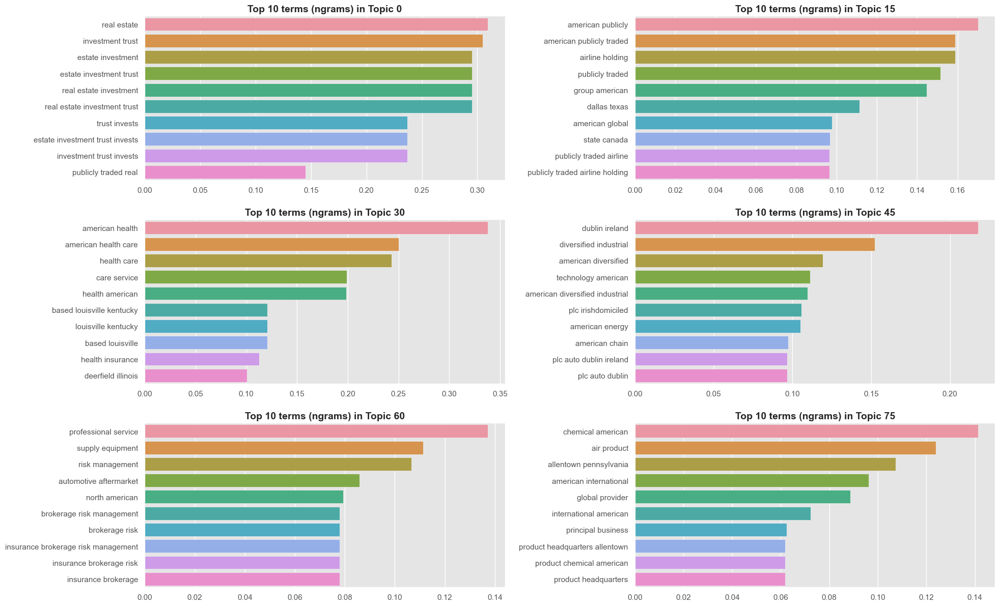

In [10]:
print('-'*50)
print('Plot top terms (ngrams) within each topic\n')
def plot_topic_top10_terms(data_df: pd.DataFrame):
    """
    Plot top 10 terms (ngram) within the topic for 
    a sample of topics.

    Parameters:
    -----------
    data_df : pd.DataFrame
        Word-topic DF computed from the LSA algoithm.
    """
    fig1 = plt.figure(figsize=(20, 20))
    fig1.subplots_adjust(hspace=.5, wspace=.5)
    plt.clf()
    for i in range(0, 6):
        fig1.add_subplot(5, 2, i+1)
        temp = data_df.iloc[:, i*15]
        temp = temp.sort_values(ascending=False)
        plt.title(f'Top 10 terms (ngrams) in Topic {i*15}', weight='bold', fontsize=14)
        sns.barplot(x= temp.iloc[:10].values, y=temp.iloc[:10].index)
        i += 1
    fig1.tight_layout(pad=2.0)
    plt.show()

# Plot top 10 terms within each topic
plot_topic_top10_terms(word_topic_df)

In [11]:
# dimensionality reduced DF (10000 features to 80 with explained variance of ~25%)
document_topic_df.head()

,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9,Topic_10,Topic_11,Topic_12,Topic_13,Topic_14,Topic_15,Topic_16,Topic_17,Topic_18,Topic_19,Topic_20,Topic_21,Topic_22,Topic_23,Topic_24,Topic_25,Topic_26,Topic_27,Topic_28,Topic_29,Topic_30,Topic_31,Topic_32,Topic_33,Topic_34,Topic_35,Topic_36,Topic_37,Topic_38,Topic_39,Topic_40,Topic_41,Topic_42,Topic_43,Topic_44,Topic_45,Topic_46,Topic_47,Topic_48,Topic_49,Topic_50,Topic_51,Topic_52,Topic_53,Topic_54,Topic_55,Topic_56,Topic_57,Topic_58,Topic_59,Topic_60,Topic_61,Topic_62,Topic_63,Topic_64,Topic_65,Topic_66,Topic_67,Topic_68,Topic_69,Topic_70,Topic_71,Topic_72,Topic_73,Topic_74,Topic_75,Topic_76,Topic_77,Topic_78,Topic_79
ticker,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
MMM,0.001317,0.010219,0.000106,-0.003857,-0.002021,0.019183,0.040101,-0.011085,0.001204,-0.001948,-0.001927,-0.000436,0.000209,-0.004487,0.000372,-0.004192,-0.027307,0.008744,0.004591,-0.010164,-0.015428,0.009803,-0.009713,-0.002955,-0.004814,0.005700,-0.001859,-0.006166,0.006633,0.020367,0.074525,0.004161,-0.005148,-0.003867,0.043065,-0.023706,0.003831,-0.002228,-0.022095,0.010569,0.004222,-0.007223,-0.011055,-0.013808,-0.027346,-0.005787,0.013986,-0.008183,-0.022163,0.006542,-0.016995,-0.032225,0.047727,-0.001242,0.012539,-0.001666,-0.027137,-0.015259,0.024019,0.000805,-0.041250,0.028105,0.019863,-0.019905,-0.011656,0.065125,-0.062236,0.074976,-0.027361,0.023380,-0.029145,-0.063446,-0.004555,-0.020506,-0.084190,-0.001705,0.006187,-0.021628,-0.045327,0.033233
AOS,0.000394,0.006185,0.001340,-0.003471,0.000504,0.000118,0.008611,-0.004177,0.002942,0.039703,0.006974,0.004752,0.000056,-0.017692,-0.009791,-0.016675,-0.019330,0.010432,0.001929,0.010313,-0.028788,0.010663,0.018272,-0.097751,0.022460,0.023826,0.025265,0.025914,-0.010179,0.023462,-0.000306,-0.022752,-0.024392,-0.121493,-0.124298,-0.053155,0.043035,0.155302,0.061141,-0.010606,-0.081234,0.002686,0.014105,-0.017744,-0.003381,-0.031484,-0.037308,0.061972,-0.040341,-0.033148,-0.001780,0.069178,0.144810,-0.025846,-0.017145,-0.030380,0.026227,-0.013332,-0.045285,0.027753,-0.017241,-0.026194,0.033360,0.004465,-0.019892,0.036509,-0.026868,-0.001680,0.006714,-0.044156,-0.012803,0.035939,0.041106,0.008937,0.025751,0.004230,-0.041962,-0.015867,-0.007204,0.035159
ABT,0.002012,0.005131,0.001449,-0.008967,-0.000546,0.002905,0.063159,0.021868,-0.011188,0.025847,-0.003165,0.007790,-0.005273,-0.022502,0.020297,0.041320,-0.104031,0.098854,-0.112929,-0.139859,-0.139024,0.142246,-0.156264,0.080173,0.067253,0.038873,-0.220981,-0.197963,0.001421,0.066705,0.028196,-0.040746,0.008935,-0.066553,0.053693,0.016757,-0.010728,0.019946,0.032791,0.003122,-0.029798,-0.001529,-0.022344,-0.038685,0.000285,-0.026890,-0.028806,0.000750,0.004238,0.006505,0.028048,-0.038941,0.004125,-0.073596,-0.003476,0.031248,0.073580,-0.003348,0.032347,-0.004884,-0.014548,-0.007704,-0.019158,0.017921,0.023141,0.032971,-0.068949,0.039259,-0.053875,-0.035382,0.013631,-0.010568,0.026378,0.031112,-0.000422,0.003954,0.009981,0.029887,-0.011466,-0.053604
ABBV,0.030886,0.029403,-0.000284,-0.030940,-0.053864,-0.000619,0.061365,0.245094,-0.039065,0.052049,0.089877,0.097702,-0.045865,-0.083226,-0.011418,0.228311,-0.088922,0.013816,-0.063596,-0.071825,0.089510,-0.077297,0.077509,0.080716,-0.066992,0.033601,-0.025183,0.010569,-0.017104,0.025536,0.009997,0.013051,0.005851,-0.024211,-0.083579,0.010016,-0.058268,-0.025380,-0.038272,-0.028770,-0.016250,0.016330,-0.011343,-0.005352,0.050250,0.037209,0.056034,-0.035757,-0.035197,-0.006945,-0.004054,-0.025931,0.048918,-0.002412,-0.044934,0.030546,-0.002425,-0.113608,-0.064864,0.013086,0.000120,0.053694,-0.083049,0.015491,0.036537,-0.030858,0.012223,0.012816,-0.056146,-0.039894,-0.019759,-0.000783,0.026475,-0.001161,0.038274,-0.055017,0.040001,-0.002775,-0.003025,-0.025844
ACN,0.000036,0.002454,0.000065,-0.010598,0.013270,-0.000410,-0.003282,0.000701,-0.015232,0.002112,0.002757,-0.010604,0.008679,0.005414,0.

---

### 3. Combined Feature space creation

In [12]:
final_features_df = pd.concat([ratios_pp_df, document_topic_df], axis=1, join='inner')
# standard scaling and normalisation
final_features_df = std_normalise_data(final_features_df)
print(final_features_df.shape)
final_features_df.head()

(500, 92)


,PC_0,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,PC_10,PC_11,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9,Topic_10,Topic_11,Topic_12,Topic_13,Topic_14,Topic_15,Topic_16,Topic_17,Topic_18,Topic_19,Topic_20,Topic_21,Topic_22,Topic_23,Topic_24,Topic_25,Topic_26,Topic_27,Topic_28,Topic_29,Topic_30,Topic_31,Topic_32,Topic_33,Topic_34,Topic_35,Topic_36,Topic_37,Topic_38,Topic_39,Topic_40,Topic_41,Topic_42,Topic_43,Topic_44,Topic_45,Topic_46,Topic_47,Topic_48,Topic_49,Topic_50,Topic_51,Topic_52,Topic_53,Topic_54,Topic_55,Topic_56,Topic_57,Topic_58,Topic_59,Topic_60,Topic_61,Topic_62,Topic_63,Topic_64,Topic_65,Topic_66,Topic_67,Topic_68,Topic_69,Topic_70,Topic_71,Topic_72,Topic_73,Topic_74,Topic_75,Topic_76,Topic_77,Topic_78,Topic_79
ticker,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
A,-0.047606,0.028216,0.217373,0.052217,0.142574,-0.025325,0.055999,0.074356,-0.110479,0.036152,-0.019658,-0.063445,-0.025991,-0.022748,-0.015467,-0.012918,0.015802,-0.004717,0.039196,0.004904,0.021462,0.123748,0.010369,-0.086596,0.128538,-0.011001,0.494352,-0.013219,0.018893,-0.117098,0.248367,-0.167961,0.164490,0.059222,-0.026910,-0.002057,-0.035047,-0.137809,0.055531,0.006155,-0.094681,0.231771,0.012503,-0.112020,0.123577,-0.104984,0.076013,0.046302,-0.109218,0.000628,0.055003,0.078763,-0.079201,0.016086,-0.016886,-0.031914,0.163325,0.141836,0.029019,0.175714,0.084401,-0.068810,0.089090,-0.062739,0.051854,-0.027802,0.162182,-0.121471,-0.125625,-0.073907,0.024292,-0.066566,0.012127,0.007758,0.035009,-0.013610,-0.062700,-0.069365,0.136053,-0.026158,0.032226,0.006500,-0.007773,-0.006922,0.063500,0.064311,0.092749,-0.065160,-0.183139,-0.042995,-0.196410,-0.124265
AAL,0.027664,-0.017354,0.010319,0.086221,-0.085542,0.019513,0.099082,-0.017149,0.025716,-0.000146,-0.036269,0.041459,0.006852,0.024367,-0.012745,-0.050146,-0.081527,-0.010304,0.154501,0.356296,-0.051454,0.031106,0.162654,0.192208,-0.091136,-0.190960,-0.041141,0.502246,0.023502,0.013749,-0.110948,-0.113784,0.220024,-0.161226,0.165626,0.131905,-0.062094,0.095192,-0.031568,0.073807,-0.017883,-0.031699,0.003018,-0.008222,0.023097,-0.071808,-0.060047,-0.018613,-0.083322,-0.021177,-0.059259,-0.107875,-0.012794,0.104057,-0.110075,0.010806,-0.037814,0.020389,0.012754,0.059061,0.084671,0.056413,0.079478,0.013158,0.076396,0.116230,-0.016998,-0.023948,-0.043684,0.226027,0.053799,-0.047509,0.070414,-0.053749,0.203477,0.006777,-0.076233,0.077666,-0.119543,-0.064856,0.100997,0.009184,0.076206,-0.002228,-0.004088,0.031543,-0.050349,0.007332,-0.122948,0.081678,-0.006408,0.003295
AAP,0.130247,-0.021007,-0.105631,0.043295,-0.052271,-0.141597,-0.025538,0.027975,-0.070732,-0.016054,0.019336,-0.005434,-0.018743,-0.021305,-0.009321,-0.014170,0.022165,-0.009993,-0.006246,0.030319,0.032270,0.001331,0.017560,0.114136,-0.197825,0.143888,0.071016,-0.074537,-0.035145,-0.044512,0.002553,0.043539,0.003388,-0.042349,-0.025477,0.012062,-0.041420,0.046681,-0.024254,0.031121,-0.009130,0.000086,-0.027358,-0.029692,-0.041779,0.028039,0.058074,-0.000270,0.016734,0.018946,0.007048,-0.016015,-0.011902,0.034665,0.060595,-0.040444,-0.028333,-0.008227,-0.033017,0.012520,-0.016141,0.034692,0.021630,-0.000049,-0.031564,-0.155732,0.059079,-0.044242,-0.072505,0.128275,-0.186458,0.123064,0.202235,0.043806,0.115459,0.201410,0.055328,0.084363,-0.047429,0.216649,-0.221648,0.124234,-0.036445,0.063695,-0.157069,0.088729,-0.051241,-0.334411,-0.004057,-0.240906,0.466021,-0.263090
AAPL,0.017171,0.228778,0.075999,-0.107931,-0.121629,-0.116954,0.039089,0.097210,0.006521,0.051256,0.080987,-0.012357,-0.027794,-0.033191,-0.016431,0.002199,-0.007368,0.138167,-0.009508,0.009253,-0.021993,0.049655,-0.032589,-0.049665,0.063248,-0.035017,0.206372,0.034025,-0.054993,-0.070087,0.034999,0.126319,-0.127134,0.086848,0.077885,0.031323,0.027523,0.131186,-0.024682,0.079731,0.021824,-0.254174,0.060912,-0.045211,0.117790,0.300646,-0.198155,-0.038045,0.000168,-0.103475,0.058484,0.005343,-0

In [13]:
# final_features_df.describe(include='all')

<Axes: title={'center': 'Feature space correlation map\n'}>

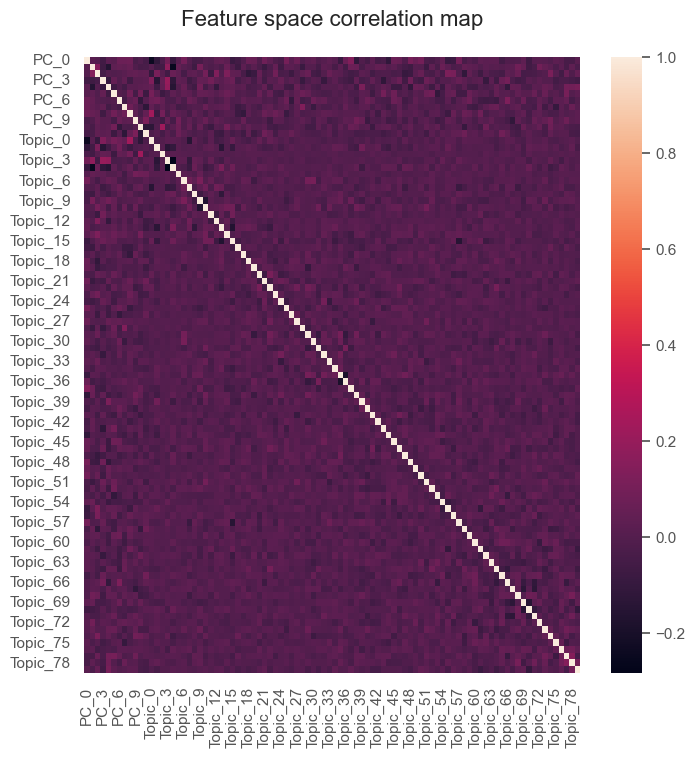

In [14]:
fig, ax = plt.subplots(figsize=(8,8))
plt.title('Feature space correlation map\n', fontsize=16)
sns.heatmap(final_features_df.corr(), ax=ax)

In [15]:
# sns.pairplot(final_features_df[final_features_df.columns[10:16]], diag_kind='kde')

1. As we can see from the heat map above, all features in the feature space have nearly zero correlation with each other, indicating the goodness of the feature space for model fitting. However the attributes are now all on the same scale, with a mean of 0, standard deviation of 1.

2. The data has no missing values now, nor duplicate entries. Outliers have been identified, but not treated and they are assumed to be real data points & not anomalies in this context for modeling

---

### 4. Model fitting and clustering

Util functions for clustering

In [16]:
def plot_TSNE(data: pd.DataFrame, labels):
    """
    Plot the results of the t-SNE algorithm to visualise the 
    cluster formations from high dimensional data on a 2-D plot 

    Parameters:
    -----------
    data : pd.DataFrame
        Dataframe containing processed data on which the clustering model was fit.

    labels : nd array
        Array of computed cluster labels.

    Returns: 
    --------
    clustered_series_all : pd.Series
        Pandas series with tickers and cluster labels.
    """
    # all stock with its cluster label (including -1)
    clustered_series_all = pd.Series(index=data.index, data=labels)
    # use TSNE algorithm to plot multidimension into 2D
    tsne_data = TSNE(n_components=2, perplexity=80, random_state=1337).fit_transform(data)
    tsne_df = pd.DataFrame(data=tsne_data, index=data.index, columns=['tsne_1', 'tsne_2'])
    tsne_df['label'] = labels
    # clustered
    tsne_df = tsne_df[tsne_df['label'] != -1]
    sns.lmplot(data=tsne_df, x='tsne_1', y='tsne_2', hue='label', height=6, aspect=2, fit_reg=False, legend=True, palette=sns.color_palette(cc.glasbey, len(tsne_df.label.value_counts())), 
               scatter_kws={'s':150, 'alpha': 0.5})
    # unclustered in the background
    plt.scatter(tsne_data[(clustered_series_all==-1).values, 0], tsne_data[(clustered_series_all==-1).values, 1], s=50, alpha=0.05)
    plt.title('t-SNE plot for all stocks with cluster labels\n', weight='bold').set_fontsize('14')
    plt.xlabel('t-SNE comp 1', weight='bold', fontsize=12)
    plt.ylabel('t-SNE comp 2', weight='bold', fontsize=12)
    plt.tight_layout(pad=2.0)
    plt.show()
    return clustered_series_all


# show number of stocks in each cluster 
def plot_cluster_counts(labels_df: pd.DataFrame):
    """
    Plot cluster counts histogram bar chart 

    Parameters:
    -----------
    labels_df : pd.DataFrame (Series)
        Pandas Series containing tickers and cluster labels as output by plot_TSNE.
    """
    plt.figure(figsize=(12,8))
    labels_df[labels_df!=-1].value_counts().sort_index().plot(kind='barh')
    plt.title('Cluster stock counts\n', weight='bold', fontsize=12)
    plt.xlabel('Stocks in Cluster', weight='bold', fontsize=10)
    plt.ylabel('Cluster Number', weight='bold', fontsize=10)
    fig.tight_layout(pad=2.0)
    plt.show()

# plot price movements for cluster stocks
def plot_cluster_members(labels_df: pd.DataFrame):
    """
    Plot the cluster members' (stocks) log prices
    to observe if there's any similarity in patterns

    Parameters:
    -----------
    labels_df : pd.DataFrame (Series)
        Pandas Series containing tickers and cluster labels as output by plot_TSNE.
    """
    # get the number of stocks in each cluster 
    counts = labels_df[labels_df!=-1].value_counts()
    # let's visualize some clusters
    cluster_vis_list = list(counts[counts>1].sort_values().index)
    # this code needs to be replaced with code to fetch from db
    hist_price_df = pd.read_csv('../data/stocks_hist_price.csv', date_parser=['date'])
    hist_price_df.date = pd.to_datetime(hist_price_df.date, format='ISO8601')
    temp_df = hist_price_df.pivot_table(values='Adj Close', index='date', columns='ticker')
    # plot a handful of the smallest clusters
    plt.figure(figsize=(24, 48))
    plt.subplots_adjust(hspace=.25, wspace=.25)
    plt.clf()
    i=1
    for clust in cluster_vis_list[0:min(len(cluster_vis_list), 4)]:
        tickers = list(labels_df[labels_df==clust].index)
        means = np.log(temp_df.loc[:dt.datetime(2019, 12, 31), tickers].mean())
        data = np.log(temp_df.loc[:dt.datetime(2019, 12, 31), tickers]).sub(means)
        plt.subplot(4, 1, i) 
        plt.plot(temp_df.loc[:dt.datetime(2019, 12, 31), tickers].index, data)
        plt.title(f'Time series of log returns for stocks in Cluster {clust}\n', weight='bold', fontsize=14)
        plt.xlabel('Date', weight='bold', fontsize=12)
        plt.ylabel('Log returns', weight='bold', fontsize=12)
        tkr_names = [f'{tkr} - {sp500_stocks_profile_df[sp500_stocks_profile_df.ticker == tkr].company_name.values[0]}' for tkr in tickers]
        plt.legend(tkr_names)
        i+=1
    fig.tight_layout(pad=2.0)
    plt.show()

##### ****************************************************************************

#### 4.1 Partitional Clustering - K-means

Partitional clustering divides data objects into nonoverlapping groups. In other words, no object can be a member of more than one cluster, and every cluster must have at least one object.

K-Means is the most common unsupervised learning technique, mostly due to its simplicity and effectiveness. It is a fast algorithm, that can run on millions of observations, but it does have its drawbacks. First of all, it does not perform well with data structures that are not spherical. It also does not perform well when the density of points is heterogeneous, meaning that in some areas of the distribution the density is higher than in others. Finally, the number of clusters K has to also be chosen, requiring a somewhat qualitative decision to be made.

While for the first two issues there is not a remedy other than choosing another algorithm, the number of clusters K can be chosen in a relatively rigorous manner. We can iteratively run the K-Means algorithm with an increasing number of K until a somewhat large number (e.g. 50). Then, we can plot a performance measure for each value of K on a chart. By inspecting the chart, we can find the “elbow”, meaning where the performance peaks, for then yielding marginal returns at higher values of K. The value of K we can choose is exactly when the performance gain is marginal with respect to the increase in K. Out of the many performance measures, the most used are usually, Silhouette Coefficient, Distortion and Gap Statistic. We have used the Silhouetter Coefficient for evaluating the performance.

--------------------------------------------------
Find the optimal k value for fitting K-means model

Knee point, SS : (13, 0.05244090280420337)


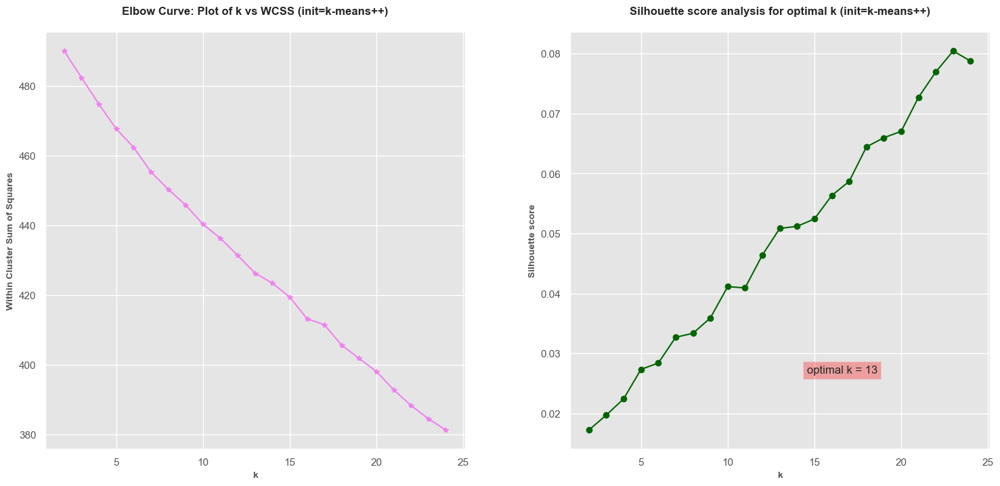

Optimal k based on Elbow curve: None

Optimal k based on Silhouette score analysis: 13


------------------------------------

TSNE plot for the model


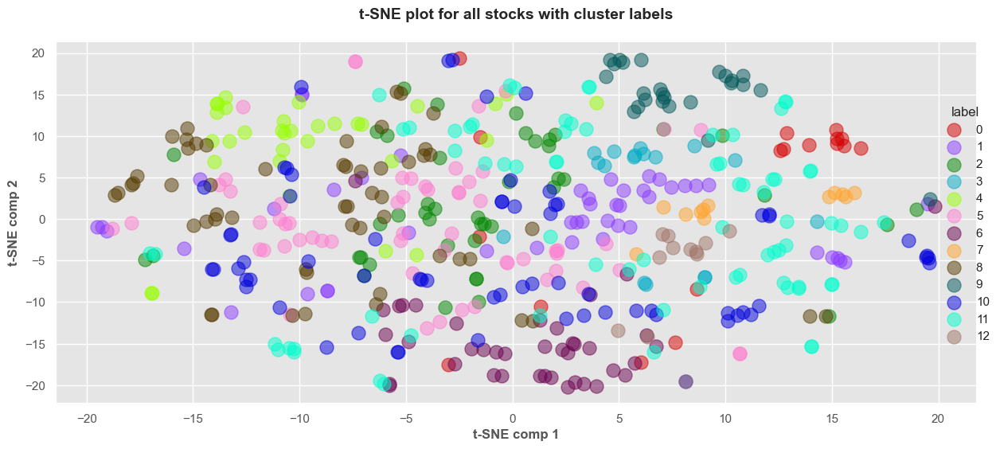


------------------------------------

Cluster counts bar chart


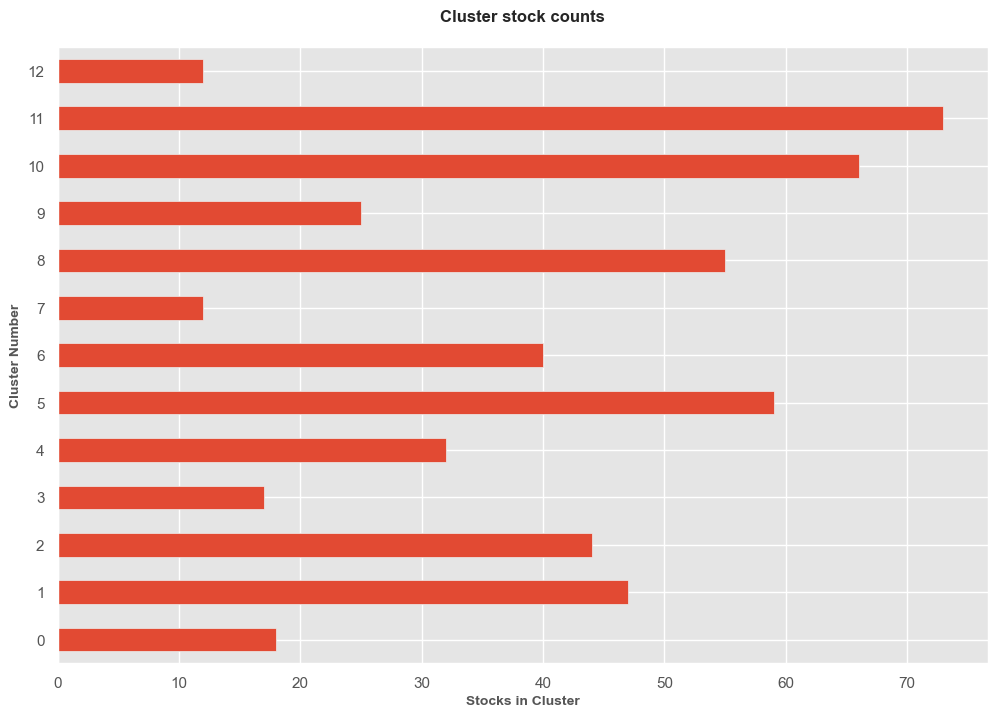


------------------------------------

Cluster member price movements: sample plots of 4 smallest clusters


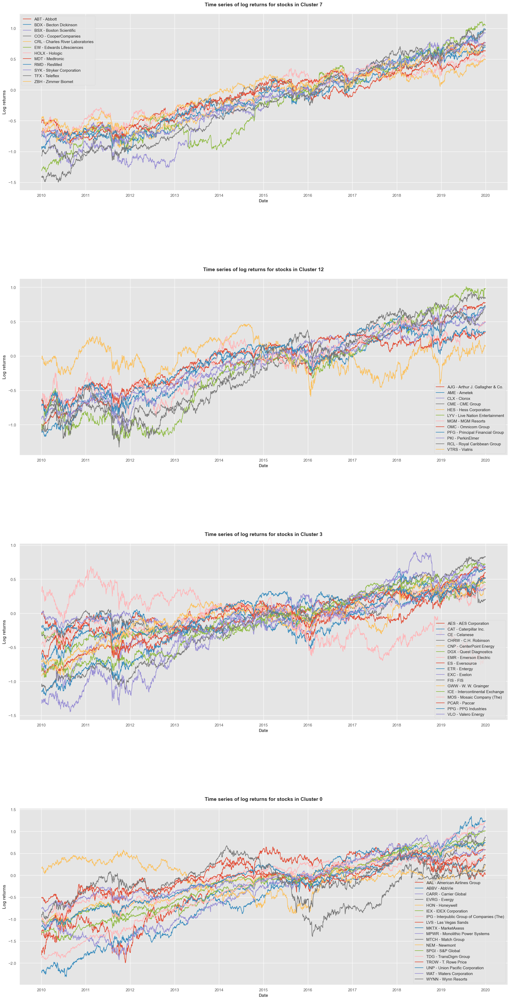

In [17]:
def find_optimal_k(data = pd.DataFrame(), k_range: range=range(2, 50), init: str='k-means++'):
    """
    Plot the elbow curve & compute silhouette scores to find optimal 'k' for k-means
    for a range of k values.

    Parameters:
    -----------
    data : pd.DataFrame
        Dataframe containing processed data on which the k-means model is to be fit.

    k_range : range, default value is range(2, 50)
        Range of 'k' values within which the model fit needs to be evaluated.

    init : str, default value is 'k-means++'
        {'k-means++', 'random'}, Method for initialisation.

    Returns: 
    --------
    knee_elbow.knee : int
        Elbow curve knee point.

    knee_ss.knee : int
        Silhouette score knee point.
    """
    WCSS = []
    SS = []
    for k in k_range:
        km = KMeans(n_clusters = k, init=init, max_iter=20000, n_init=100, random_state=1500)
        km.fit(data)
        WCSS += [km.inertia_]
        SS += [silhouette_score(data, labels=km.labels_, random_state=1500)]
    # plot the charts
    fig1 = plt.figure(figsize=(18, 8))
    fig1.subplots_adjust(hspace=.5, wspace=.25)
    plt.clf()
    # Elbow curve for WCSS scores
    plt.subplot(1, 2, 1)
    plt.plot(k_range, WCSS, color='violet', marker='*')
    plt.xlabel('k', weight='bold', fontsize=10)
    plt.ylabel('Within Cluster Sum of Squares', weight='bold', fontsize=10)
    plt.title(f'Elbow Curve: Plot of k vs WCSS (init={init})\n', weight='bold', fontsize=12)
    knee_elbow = KneeLocator(k_range, WCSS, S=10, online=True,  curve='convex', direction='decreasing', interp_method='interp1d')
    if knee_elbow.knee!=None and knee_elbow.knee in range(len(WCSS)):
        plt.axvline(x=knee_elbow.knee, ymax=0.95, ymin=0.05, color='brown', ls='--')
        print(f'Knee point, WCSS : {knee_elbow.knee, WCSS[knee_elbow.knee]}')
        plt.figtext(0.25, 0.25, f'optimal k = {knee_elbow.knee}', bbox=dict(facecolor='red', alpha=0.3), fontsize=12)

    # Silhouette scores plot
    plt.subplot(1, 2, 2)
    plt.plot(k_range, SS, color='darkgreen', marker='o')
    plt.xlabel('k', weight='bold', fontsize=10)
    plt.ylabel('Silhouette score', weight='bold', fontsize=10)
    plt.title(f'Silhouette score analysis for optimal k (init={init})\n', weight='bold', fontsize=12)
    knee_ss = KneeLocator(k_range, SS, S=10, online=True, curve='concave', direction='increasing', interp_method='interp1d')
    if knee_ss.knee!=None and knee_ss.knee in range(len(SS)):
        print(f'Knee point, SS : {knee_ss.knee, SS[knee_ss.knee]}')
        plt.figtext(0.75, 0.25, f'optimal k = {knee_ss.knee}', bbox=dict(facecolor='red', alpha=0.3), fontsize=12)
    fig.tight_layout(pad=2.0)
    plt.show()
    return knee_elbow.knee, knee_ss.knee


def km_final_fit(data_df: pd.DataFrame, opt_k: int):
    """
    Fit k-means model on the processed data and 
    plot all charts for the model cluster predictions 

    Parameters:
    -----------
    data : pd.DataFrame
        Dataframe containing processed data on which the k-means model is to be fit.

    opt_k : int
        Optimal 'k' value computed by find_optimal_k().

    Returns: 
    --------
    km_final_clusters_df : pd.DataFrame
        DF with cluster labels.
    """
    # Fit the K-means model on the data with the optimal 'k'
    k_final = opt_k # we get this value from either Elbow test or Silhouette score analysis
    km_final = KMeans(n_clusters = k_final, init='k-means++', max_iter=20000, n_init=100, random_state=1500)
    km_final = km_final.fit(data_df)
    km_final_clusters_df = pd.DataFrame(index=data_df.index, columns=['km_cluster'])
    km_final_clusters_df['km_cluster'] = km_final.labels_

    # TSNE
    print('\n------------------------------------\n')
    print('TSNE plot for the model')
    labels_df = plot_TSNE(data_df, km_final.labels_)
    # plot cluster count (bar chart)
    print('\n------------------------------------\n')
    print('Cluster counts bar chart')
    plot_cluster_counts(labels_df)
    # plot cluster members
    print('\n------------------------------------\n')
    print('Cluster member price movements: sample plots of 4 smallest clusters')
    plot_cluster_members(labels_df)
    return km_final_clusters_df


print('-'*50)
print('Find the optimal k value for fitting K-means model\n')
opt_k_elbow, opt_k_SS = find_optimal_k(final_features_df, k_range=range(2, 25), init='k-means++')
print(f'Optimal k based on Elbow curve: {opt_k_elbow}\n')
print(f'Optimal k based on Silhouette score analysis: {opt_k_SS}\n')
km_cluster_df = None
if opt_k_SS!=None or opt_k_elbow!=None:
    k_final = 0
    if opt_k_elbow == None:
        k_final = opt_k_SS
    elif opt_k_SS == None:
        k_final = opt_k_elbow
    else:
        k_final = min(opt_k_elbow, opt_k_SS)
    # fit K-means using the derived optimal k value 
    km_cluster_df = km_final_fit(final_features_df, opt_k=k_final)
else:
    raise Exception("No optimal value for k found!")


In [18]:
if (not km_cluster_df.empty):
    print(km_cluster_df.head())

        km_cluster
ticker            
A                5
AAL              0
AAP             10
AAPL             5
ABBV             0


##### ******************************************************************

#### 4.2 Density based clustering - OPTICS

Density-based clustering determines cluster assignments based on the density of data points in a region. Clusters are assigned where there are high densities of data points separated by low-density regions.

Unlike the other clustering categories, this approach doesn’t require the user to specify the number of clusters. Instead, there is a distance-based parameter that acts as a tunable threshold. This threshold determines how close points must be to be considered a cluster member.

OPTICS stands for Ordering points to identify the clustering structure. It is a density-based unsupervised learning algorithm, which was developed by the same research group that developed DBSCAN.

A single cutoff of distance is applied in DBSCAN to determine whether two data points are close to each other (neighbors) or not. But it may not always be an ideal solution because a “long” distance in one cluster could be a “short” distance in another. In OPTICS each point is assigned a core distance that describes the distance to the MinPtsth closest point, and a reachability distance of another point o from a point p that is either the distance between o and p, or the core distance of p, whichever is bigger.

Running density based clustering - OPTICS model
----------------------------------------------------------------------------------------------------
max_eps: inf
min_samples: 7
model fit params: {'algorithm': 'auto', 'cluster_method': 'xi', 'eps': None, 'leaf_size': 30, 'max_eps': inf, 'memory': None, 'metric': 'minkowski', 'metric_params': None, 'min_cluster_size': None, 'min_samples': 7, 'n_jobs': None, 'p': 2, 'predecessor_correction': True, 'xi': 0.04}


The Silhouette Score for our OPTICS model fit on preprocessed & scaled data : 0.015521626982696919

The Calinski Harabasz Score for our OPTICS model fit on preprocessed & scaled data : 5.313321007047467
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
TSNE plot for the model


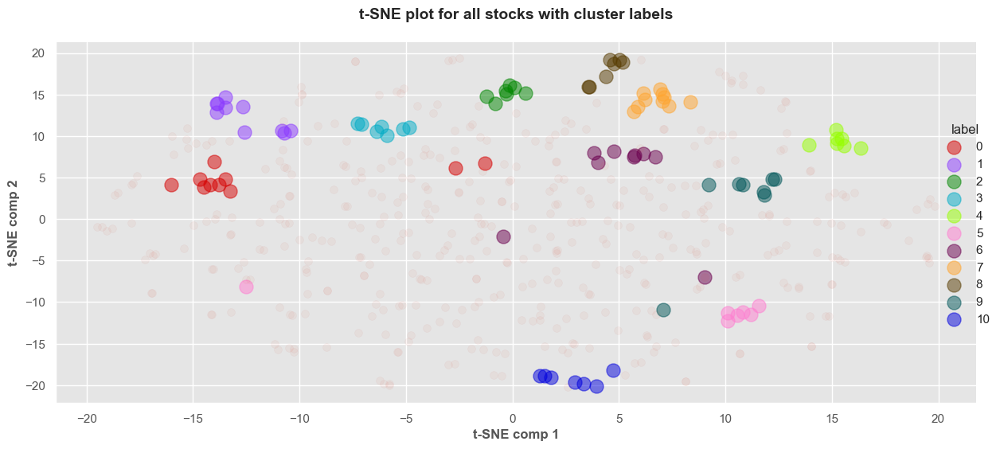

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Cluster counts bar chart


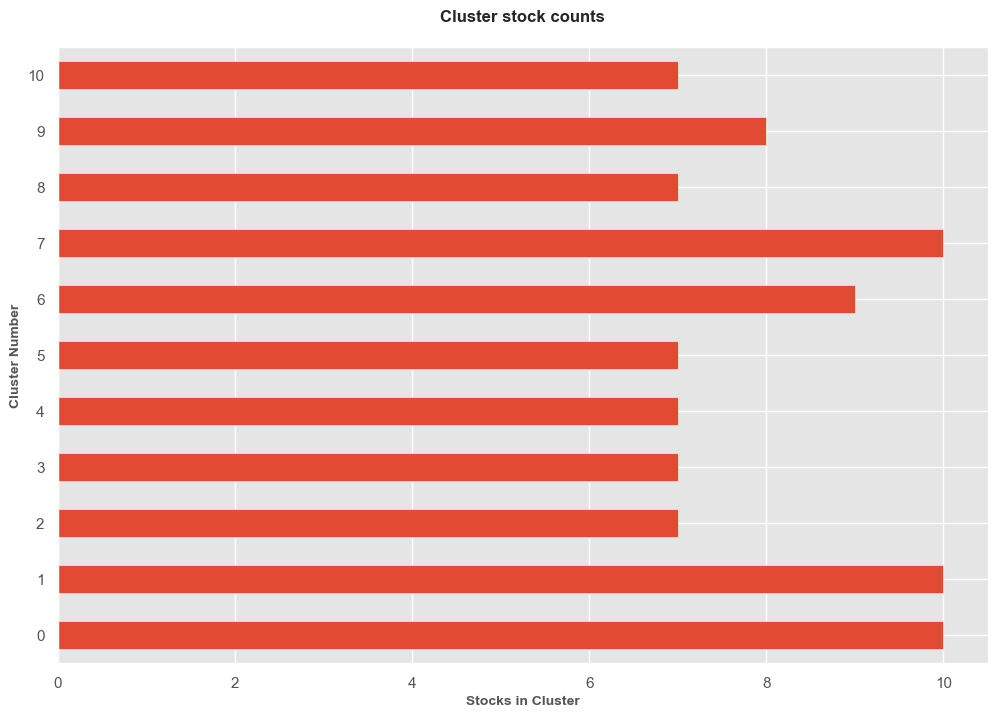

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Cluster member price movements: sample plots of 4 least dense clusters


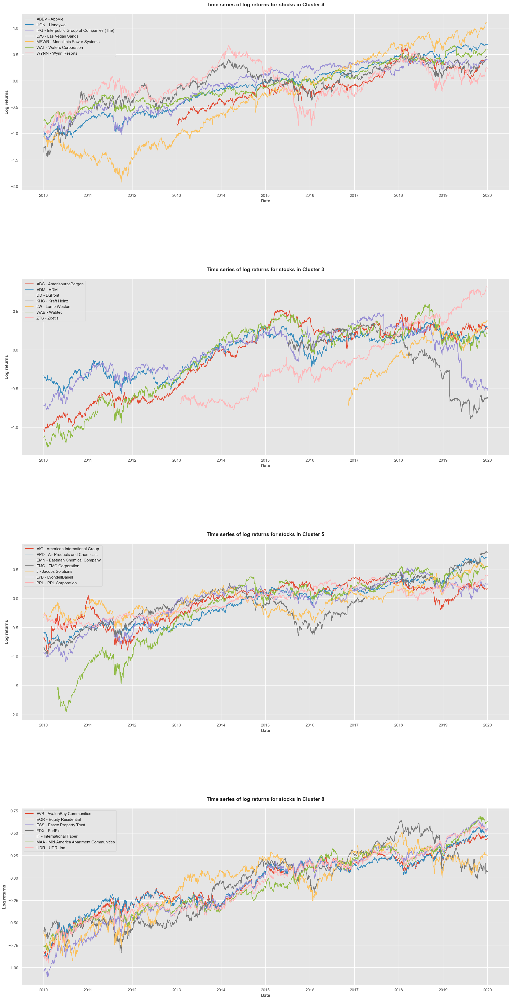

In [19]:
def optics_fit(data_df: pd.DataFrame, max_eps: float=np.inf, min_samples: int=5):
    """
    Fit OPTICS clustering algorithm over the data;
    Plot all charts for the model predictions  

    Parameters:
    -----------
    data_df : pd.DataFrame
        Dataframe containing processed data on which the density based OPTICS model is to be fit.

    max_eps : int
        The maximum distance between two samples for one to be considered as in the neighborhood of the other. 
        Default value of np.inf will identify clusters across all scales; reducing max_eps will result in shorter run times.

    min_samples : int, default is 5
        The number of samples in a neighborhood for a point to be considered as a core point. 
        Also, up and down steep regions can't have more than min_samples consecutive non-steep points. 
        Expressed as an absolute number or a fraction of the number of samples (rounded to be at least 2).

    Returns: 
    --------
    db_final_clusters_df : pd.DataFrame
        DF with computed cluster labels.
    """
    print('Running density based clustering - OPTICS model')
    print('--'*50)
    print(f'max_eps: {max_eps}\nmin_samples: {min_samples}')
    db = OPTICS(max_eps=max_eps, min_samples=min_samples, xi=0.04).fit(data_df)
    labels = db.labels_
    print(f'model fit params: {db.get_params()}\n')
    # Compute Silouette score
    sil_score = silhouette_score(data_df, labels=labels, random_state=1500)
    print(f'\nThe Silhouette Score for our OPTICS model fit on preprocessed & scaled data : {sil_score}')
    # Compute Calinski Harabasz score
    cal_hb_score = calinski_harabasz_score(data_df, labels=labels)
    print(f'\nThe Calinski Harabasz Score for our OPTICS model fit on preprocessed & scaled data : {cal_hb_score}')
    
    # TSNE
    print('--'*100)
    print('TSNE plot for the model')
    labels_df = plot_TSNE(data_df, labels)
    # plot cluster count (bar chart)
    print('--'*100)
    print('Cluster counts bar chart')
    plot_cluster_counts(labels_df)
    # plot cluster members
    print('--'*100)
    print('Cluster member price movements: sample plots of 4 least dense clusters')
    plot_cluster_members(labels_df)

    db_final_clusters_df = pd.DataFrame(index=data_df.index, columns=['db_cluster'])
    db_final_clusters_df['db_cluster'] = labels
    return db_final_clusters_df

db_cluster_df = optics_fit(final_features_df, min_samples=7)

In [20]:
if (not db_cluster_df.empty):
    print(db_cluster_df.head())

        db_cluster
ticker            
A               -1
AAL             -1
AAP             -1
AAPL            -1
ABBV             4


##### *****************************************************************

#### 4.3 Hierarchical clustering - Agglomerative

Hierarchical clustering determines cluster assignments by building a hierarchy. This is implemented by either a bottom-up or a top-down approach:

1. Agglomerative clustering is the bottom-up approach. It merges the two points that are the most similar until all points have been merged into a single cluster.

2. Divisive clustering is the top-down approach. It starts with all points as one cluster and splits the least similar clusters at each step until only single data points remain.

These methods produce a tree-based hierarchy of points called a dendrogram. Similar to partitional clustering, in hierarchical clustering the number of clusters (k) is often predetermined by the user. Clusters are assigned by cutting the dendrogram at a specified depth that results in k groups of smaller dendrograms.

Unlike many partitional clustering techniques, hierarchical clustering is a deterministic process, meaning cluster assignments won’t change when you run an algorithm twice on the same input data.

We'll consider Agglomerative clustering for our dataset

Running hierarchical clustering (bottom-up approach) - Agglomerative model
----------------------------------------------------------------------------------------------------
n_clusters: 14
model fit params: {'affinity': 'deprecated', 'compute_distances': False, 'compute_full_tree': 'auto', 'connectivity': None, 'distance_threshold': None, 'linkage': 'average', 'memory': None, 'metric': 'euclidean', 'n_clusters': 14}


The Silhouette Score for our Agglomerative model fit on preprocessed & scaled data : 0.045700990049942394

The Calinski Harabasz Score for our Agglomerative model fit on preprocessed & scaled data : 5.705247444902356
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
TSNE plot for the model


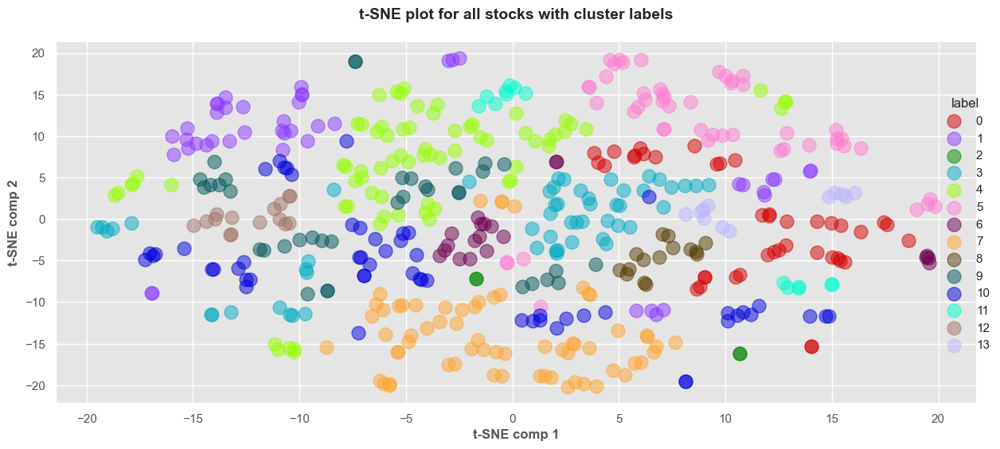

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Cluster counts bar chart


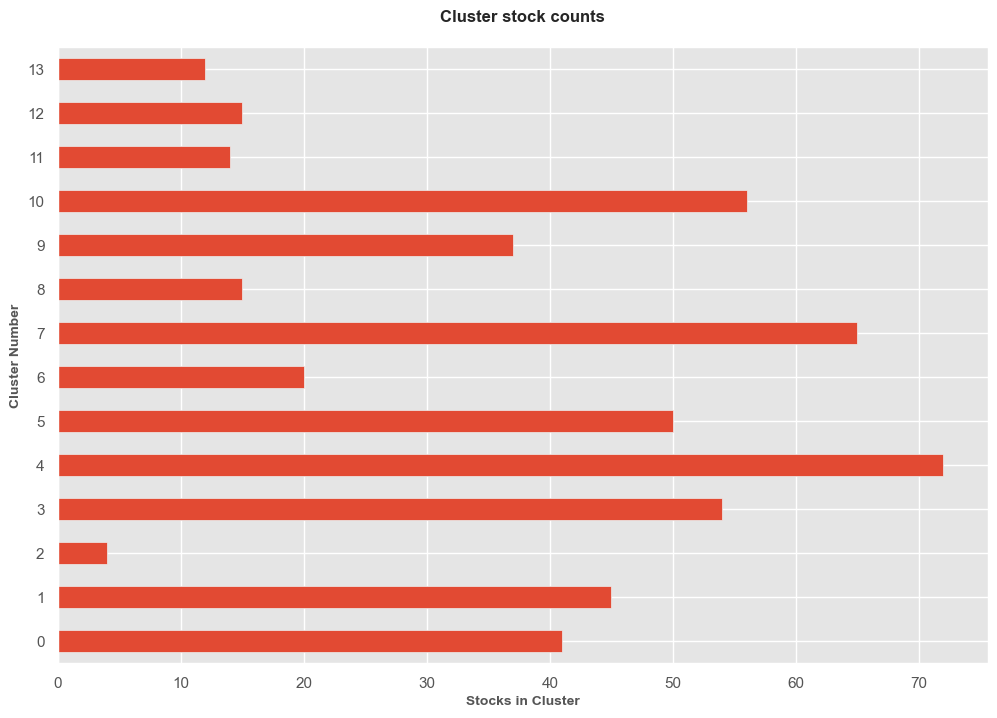

--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Cluster member price movements: sample plots of 4 least dense clusters


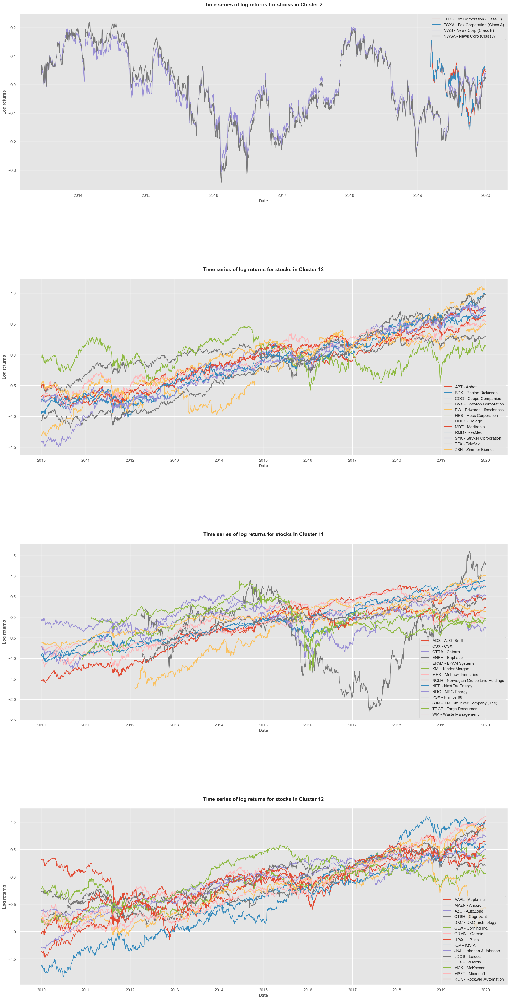

In [21]:
def agg_hc_fit(data_df: pd.DataFrame, n_clusters: int=10, linkage: str='average'):
    """
    Fit Agglomerative Clustering algorithm over the data;
    Plot all charts for the model predictions 

    Parameters:
    -----------
    data_df : pd.DataFrame
        Dataframe containing processed data on which Hierarchical Agglomerative Clustering model is to be fit.

    n_clusters : int, default is 10
        The number of clusters to find.

    linkage : str, default is 'average'
        {'ward', 'complete', 'average', 'single'}, 
        Which linkage criterion to use. The linkage criterion determines which distance to use between sets of observation. 
        The algorithm will merge the pairs of cluster that minimize this criterion.

            1. 'ward' minimizes the variance of the clusters being merged.

            2. 'average' uses the average of the distances of each observation of the two sets.

            3. 'complete' or 'maximum' linkage uses the maximum distances between all observations of the two sets.

            4. 'single' uses the minimum of the distances between all observations of the two sets.

    Returns: 
    --------
    hc_final_clusters_df : pd.DataFrame
        DF with computed cluster labels.
    """
    print('Running hierarchical clustering (bottom-up approach) - Agglomerative model')
    print('--'*50)
    print(f'n_clusters: {n_clusters}')
    hc = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage=linkage).fit(data_df)
    labels = hc.labels_
    print(f'model fit params: {hc.get_params()}\n')
    # Compute Silouette score
    sil_score = silhouette_score(data_df, labels=labels, random_state=1500)
    print(f'\nThe Silhouette Score for our Agglomerative model fit on preprocessed & scaled data : {sil_score}')
    # Compute Calinski Harabasz score
    cal_hb_score = calinski_harabasz_score(data_df, labels=labels)
    print(f'\nThe Calinski Harabasz Score for our Agglomerative model fit on preprocessed & scaled data : {cal_hb_score}')
    
    # TSNE
    print('--'*100)
    print('TSNE plot for the model')
    labels_df = plot_TSNE(data_df, labels)
    # plot cluster count (bar chart)
    print('--'*100)
    print('Cluster counts bar chart')
    plot_cluster_counts(labels_df)
    # plot cluster members
    print('--'*100)
    print('Cluster member price movements: sample plots of 4 least dense clusters')
    plot_cluster_members(labels_df)

    hc_final_clusters_df = pd.DataFrame(index=data_df.index, columns=['hc_cluster'])
    hc_final_clusters_df['hc_cluster'] = labels
    return hc_final_clusters_df

hc_cluster_df = agg_hc_fit(final_features_df, n_clusters=14, linkage='average')

In [22]:
if (not hc_cluster_df.empty):
    print(hc_cluster_df.head())

        hc_cluster
ticker            
A                3
AAL              1
AAP             10
AAPL            12
ABBV             5


##### ***************************************************************

##### Analysis of all three clustering models

In [23]:
# finally, merge DFs for all clustering results to get a singular cluster labels DF
all_clustering_df = pd.concat([km_cluster_df, db_cluster_df, hc_cluster_df], axis=1)
all_clustering_df['sector'] = [sp500_stocks_profile_df[sp500_stocks_profile_df['ticker'] == tkr]['sector'].values[0] for tkr in all_clustering_df.index]
all_clustering_df = all_clustering_df[['sector', 'km_cluster', 'db_cluster', 'hc_cluster']]
all_clustering_df.head(15)

,sector,km_cluster,db_cluster,hc_cluster
ticker,,,,
A,Health Care,5,-1,3
AAL,Industrials,0,-1,1
AAP,Consumer Discretionary,10,-1,10
AAPL,Information Technology,5,-1,12
ABBV,Health Care,0,4,5
ABC,Health Care,8,3,4
ABT,Health Care,7,-1,13
ACGL,Financials,6,-1,7
ACN,Information Technology,11,-1,4


In [24]:
# Sector-wise breakdown for k-means clusters
pd.crosstab(all_clustering_df.sector, all_clustering_df.km_cluster).style.highlight_max(color='orange', axis=0)

km_cluster,0,1,2,3,4,5,6,7,8,9,10,11,12
sector,,,,,,,,,,,,,
Communication Services,2,1,2,0,1,5,0,0,0,0,10,1,2
Consumer Discretionary,2,4,7,0,13,3,0,0,10,0,7,4,2
Consumer Staples,0,1,3,0,7,2,0,0,10,0,2,11,1
Energy,0,5,3,1,0,0,0,0,1,0,0,12,1
Financials,3,1,2,2,0,5,38,0,0,0,14,4,3
Health Care,2,3,7,1,1,13,0,12,13,0,3,8,2
Industrials,6,6,5,5,4,6,2,0,12,0,17,9,1
Information Technology,1,20,5,0,3,25,0,0,4,0,5,3,0
Materials,1,4,9,3,0,0,0,0,5,0,5,2,0


In [25]:
# Sector-wise breakdown for OPTICS clusters
pd.crosstab(all_clustering_df.sector, all_clustering_df.db_cluster).style.highlight_max(color='green', axis=0)

db_cluster,-1,0,1,2,3,4,5,6,7,8,9,10
sector,,,,,,,,,,,,
Communication Services,23,0,0,0,0,1,0,0,0,0,0,0
Consumer Discretionary,40,1,7,2,0,2,0,0,0,0,0,0
Consumer Staples,30,0,2,1,3,0,0,0,0,0,1,0
Energy,21,0,0,1,0,0,0,0,0,0,1,0
Financials,62,1,0,0,0,0,1,1,0,0,0,7
Health Care,59,2,0,0,2,2,0,0,0,0,0,0
Industrials,61,1,0,2,1,1,1,4,0,1,1,0
Information Technology,60,4,0,1,0,1,0,0,0,0,0,0
Materials,21,0,0,0,1,0,4,2,0,1,0,0


In [26]:
# Sector-wise breakdown for Agglo clusters
pd.crosstab(all_clustering_df.sector, all_clustering_df.hc_cluster).style.highlight_max(color='indigo', axis=0)

hc_cluster,0,1,2,3,4,5,6,7,8,9,10,11,12,13
sector,,,,,,,,,,,,,,
Communication Services,0,1,4,2,0,1,0,7,1,4,4,0,0,0
Consumer Discretionary,0,15,0,3,6,2,2,2,3,2,12,2,3,0
Consumer Staples,1,9,0,1,16,0,1,1,2,1,4,1,0,0
Energy,14,1,0,0,2,0,0,0,0,0,0,4,0,2
Financials,3,2,0,1,2,2,0,49,2,3,8,0,0,0
Health Care,1,1,0,12,18,7,1,0,3,6,3,0,3,10
Industrials,5,8,0,6,14,5,10,4,2,3,10,3,3,0
Information Technology,1,1,0,19,4,4,5,1,1,15,7,2,6,0
Materials,4,0,0,8,7,1,1,1,0,0,7,0,0,0


---

### 5. Select a Clustering method to proceed further with forming pairs. Also draw insights on how clusters are formed

We decide to continue with the density based OPTICS clustering model and take its cluster labels into consideration for further analysis for forming pairs because of the following reasons:

1. It's a deterministic clustering approach, which means the cluster labels won't change for every new iteration on the same data (be it in same sequential order or not). In contrast, k-means is a non-deterministic modeling method and we observed that there were significant differences in cluster labels for every new iteration of fitting the model. While Agglomerative hierarchical clustering is better than k-means in terms of retaining the same clustering philosophy, it still pales in comparison to density based clustering.

2. Although most of the stocks remained unclustered in the density based clustering, we observed that the OPTICS clusters were more clearly segmented in comparison to the other two models. This is a strong positive for further analysis for forming pairs.

In [27]:
# create a final cluster DF containing chosen cluster labels, mean ratios data, sector and company info
def get_final_clabel_profile_df(selected_label_df: pd.DataFrame):
    """
    Returns a final cluster profile dataframe containing the chosen cluster labels, 
    mean ratios data, sector and company info. 
    Mainly intended for EDA and drawing insights.

    Parameters:
    -----------
    selected_label_df : pd.DataFrame
        Cluster label DF for a selected clustering method.

    n_clusters : int, default is 10
        The number of clusters to find.

    linkage : str, default is 'average' {'ward', 'complete', 'average', 'single'} 
        Which linkage criterion to use. The linkage criterion determines which distance to use between sets of observation. 
        The algorithm will merge the pairs of cluster that minimize this criterion.

            1. 'ward' minimizes the variance of the clusters being merged.

            2. 'average' uses the average of the distances of each observation of the two sets.

            3. 'complete' or 'maximum' linkage uses the maximum distances between all observations of the two sets.

            4. 'single' uses the minimum of the distances between all observations of the two sets.

    Returns: 
    --------
    final_cluster_df : pd.DataFrame
        DF with computed cluster labels and stock profile details appended to it.
    """  
    final_cluster_df = pd.DataFrame(index=selected_label_df.index, columns=['company_name', 'sector', 'cluster'])
    final_cluster_df['company_name'] = [sp500_stocks_profile_df[sp500_stocks_profile_df.ticker == tkr]['company_name'].values[0] for tkr in final_cluster_df.index]
    final_cluster_df['sector'] = [sp500_stocks_profile_df[sp500_stocks_profile_df.ticker == tkr]['sector'].values[0] for tkr in final_cluster_df.index]
    final_cluster_df['cluster'] = [selected_label_df.loc[tkr][0] for tkr in final_cluster_df.index]
    final_cluster_df['bus_desc'] = [sp500_stocks_profile_df[sp500_stocks_profile_df.ticker == tkr]['business_desc'].values[0] for tkr in final_cluster_df.index]
    # fetch the mean target ratio measures for all stocks
    temp_rat = stock_ratios_df[['ticker', 'Fiscal Date Ending'] + target_ratios].iloc[:, 2:].apply(pd.to_numeric, errors='coerce', downcast='float')
    temp_rat = temp_rat.fillna(0)
    temp_rat = pd.concat([stock_ratios_df[['ticker', 'Fiscal Date Ending']], temp_rat], axis=1)
    temp_rat = temp_rat[temp_rat['Fiscal Date Ending'] < 2020]
    temp_rat = temp_rat.reset_index(drop=True)
    ratios_10y_mean_df = temp_rat.drop(columns=['Fiscal Date Ending']).groupby(by=['ticker']).mean()
    
    final_cluster_df = pd.concat([final_cluster_df, ratios_10y_mean_df], axis=1, join='inner')
    return final_cluster_df

final_cluster_df = get_final_clabel_profile_df(db_cluster_df)

In [28]:
final_cluster_df.head(10)

,company_name,sector,cluster,bus_desc,Quick ratio,Cash ratio,Interest coverage,Debt equity ratio,Asset turnover,Receivables turnover,Return on assets,Operating profit margin,Enterprise value multiple,Payout ratio
ticker,,,,,,,,,,,,,,
A,Agilent Technologies,Health Care,-1,"Agilent Technologies, Inc. is an American anal...",2.1998,1.66470,9.785601,1.043500,0.595300,6.741600,0.07510,0.152200,14.138300,0.23560
AAL,American Airlines Group,Industrials,-1,American Airlines Group Inc. is an American pu...,0.5416,0.03630,2.718200,-84.814407,0.850300,25.028700,0.01380,0.063200,-10.216499,0.05120
AAP,Advance Auto Parts,Consumer Discretionary,-1,"Advance Auto Parts, Inc. (Advance) is an Ameri...",0.2592,0.13000,0.000000,2.251900,1.257300,24.599300,0.06710,0.084800,10.353800,0.04480
AAPL,Apple Inc.,Information Technology,-1,Apple Inc. is an American multinational techno...,1.2103,0.31240,0.000000,1.323000,0.788200,7.176900,0.17760,0.288500,11.116200,0.18600
ABBV,AbbVie,Health Care,4,AbbVie is an American publicly traded biopharm...,1.4990,0.97925,15.328250,5.750625,0.524125,5.102375,0.10575,0.301125,15.975625,0.74325
ABC,AmerisourceBergen,Health Care,3,AmerisourceBergen Corporation is an American d...,0.4915,0.11150,0.000000,12.862101,4.874700,17.167101,0.02870,0.009700,13.700800,0.15160
ABT,Abbott,Health Care,-1,Abbott Laboratories is an American multination...,1.3424,0.73940,10.764601,1.257000,0.500400,5.570600,0.05890,0.139000,13.514099,0.94130
ACGL,Arch Capital Group,Financials,-1,"Arch Capital Group Ltd., offers insurance, rei...",0.0000,0.00000,0.000000,2.445600,0.177800,1.499600,0.03180,0.000000,11.180100,0.04310
ACN,Accenture,Information Technology,-1,Accenture plc is an Irish-domiciled multinatio...,1.2635,0.61070,0.000000,2.089700,1.716800,5.833800,0.16410,0.134600,11.314900,0.39460


In [29]:
# Sector-wise distribution among the OPTICS clusters
pd.crosstab(final_cluster_df.sector, final_cluster_df.cluster).style.highlight_max(color='darkgreen', axis=0)

cluster,-1,0,1,2,3,4,5,6,7,8,9,10
sector,,,,,,,,,,,,
Communication Services,23,0,0,0,0,1,0,0,0,0,0,0
Consumer Discretionary,40,1,7,2,0,2,0,0,0,0,0,0
Consumer Staples,30,0,2,1,3,0,0,0,0,0,1,0
Energy,21,0,0,1,0,0,0,0,0,0,1,0
Financials,62,1,0,0,0,0,1,1,0,0,0,7
Health Care,57,2,0,0,2,2,0,0,0,0,0,0
Industrials,59,1,0,2,1,1,1,4,0,1,1,0
Information Technology,60,4,0,1,0,1,0,0,0,0,0,0
Materials,21,0,0,0,1,0,4,2,0,1,0,0


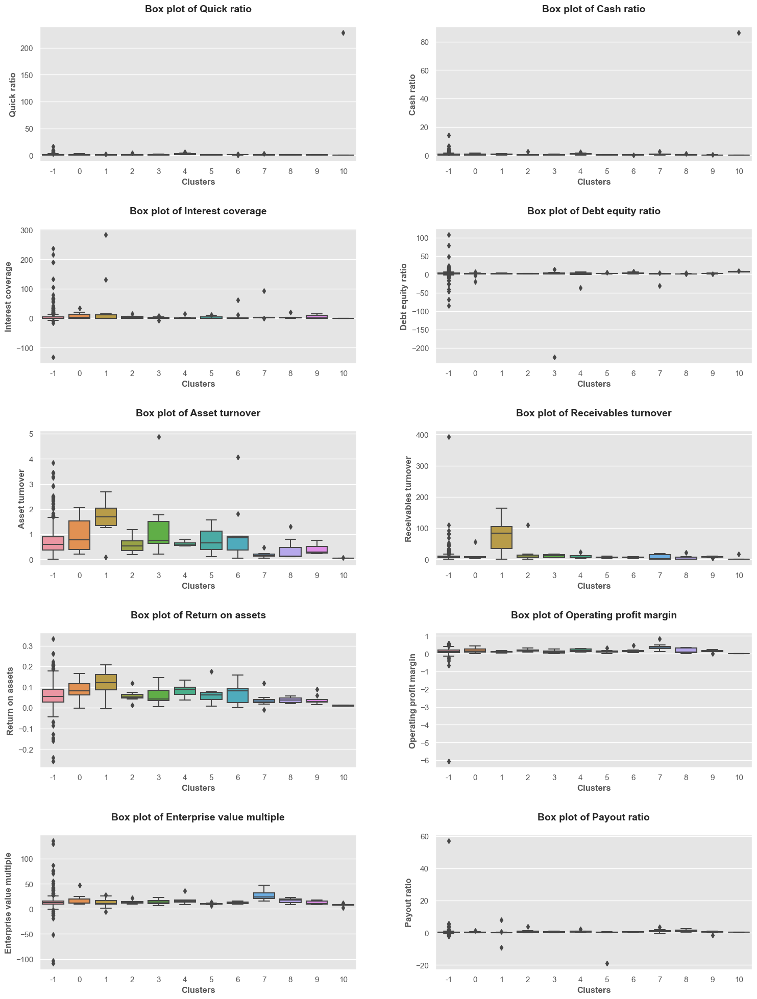

In [30]:
def boxplot_cluster_fin_ratios(data: pd.DataFrame, target_ratios: list):
    """
    Plot the boxplots of all target final ratios for each cluster.
    Parameters:
    -----------
    data : pd.DataFrame
        DF with computed cluster labels and stock profile details appended to it. 
        This is output by get_final_clabel_profile_df()
    """
    plt.figure(figsize=(18, 24))
    plt.subplots_adjust(hspace=.5, wspace=.25)
    plt.clf()
    counter = 0
    for row in range(5):
        for col in range(2):
            if counter <len(data.cluster.value_counts()):
                plt.subplot(5, 2, counter+1)
                sns.boxplot(y=data[target_ratios[counter]], x=data.cluster)
            plt.title(f'Box plot of {target_ratios[counter]}\n', weight='bold', fontsize=14)
            plt.xlabel('Clusters', weight='bold', fontsize=12)
            plt.ylabel(f'{target_ratios[counter]}', weight='bold', fontsize=12)
            counter += 1
    fig.tight_layout(pad=2.0)
    plt.show()

# plot boxplots of all fin ratios for all clusters
boxplot_cluster_fin_ratios(final_cluster_df, target_ratios)

##### Insights

To fill up here! Read the boxplots and draw meaningful insights of how different clusters are organised based on the defined target financial ratios (limit to 3-4 pointers)
Remember, cluster -1 here refers to unclustered class.

1. Cluster 0 --

2. ****--****

3. ****--****

4. ***--***

5. ****--****

--------------------------------------------------
Plot wordclouds of business descriptions of companies in each cluster



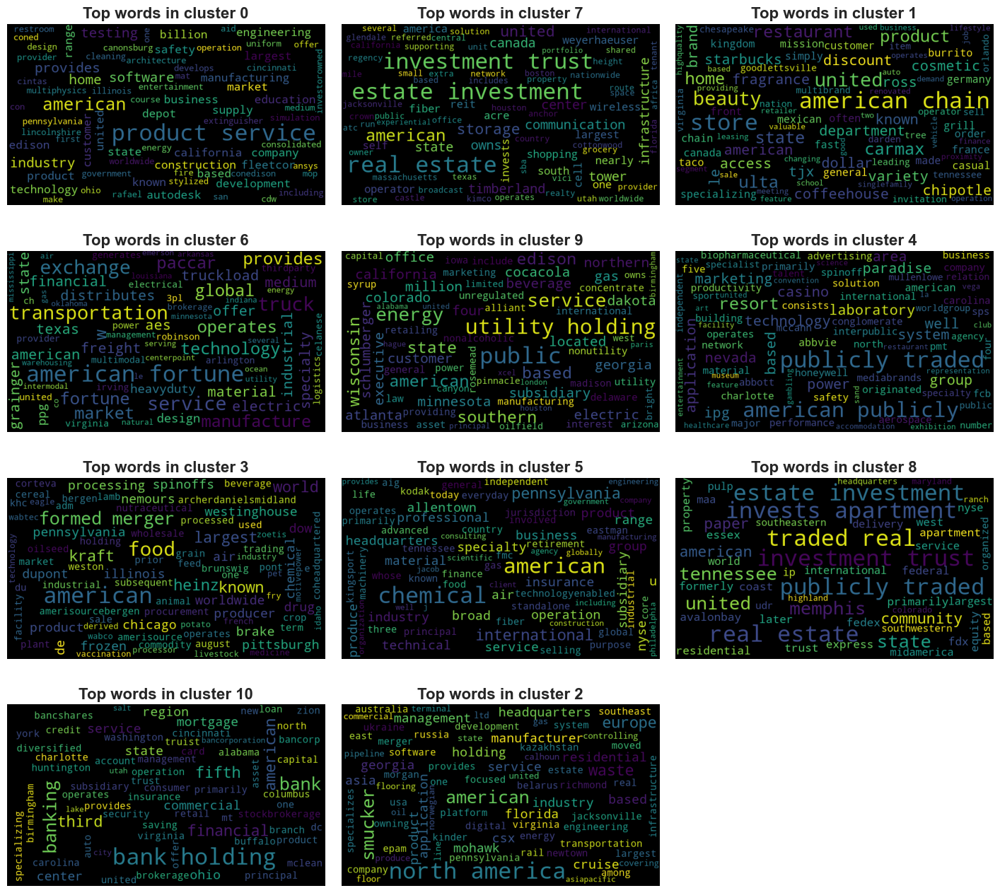

In [31]:
def plot_cluster_wordclouds(data_df: pd.DataFrame):
    """
    Plot wordclouds of business descriptions of companies in each cluster

    Parameters:
    -----------
    data_df : pd.DataFrame
        DF with computed cluster labels and stock profile details appended to it. 
        This is output by get_final_clabel_profile_df()
    """
    fig1 = plt.figure(figsize=(18, 20))
    fig1.subplots_adjust(hspace=.25, wspace=.05)
    plt.axis('off')
    plt.clf()
    cluster_labels = data_df.cluster.value_counts().index
    cluster_labels = [label for label in cluster_labels if label != -1]
    for i in range(len(cluster_labels)):
        fig1.add_subplot(5, 3, i+1)
        wc = WordCloud(background_color='black', width=700, height=400, max_words=400, min_font_size=16, max_font_size=50, random_state=1500)
        full_text = '; '.join(data_df[data_df['cluster'] == cluster_labels[i]]['bus_desc'])
        clean_text = text_cleaning(full_text)
        wc = wc.generate(str(clean_text))
        plt.axis('off')
        plt.imshow(wc, cmap=cm.Dark2_r)
        plt.title(f'Top words in cluster {cluster_labels[i]}', weight='bold', fontsize=16)
        i += 1
    fig.tight_layout(pad=2.0)
    plt.show()

# Plot wordclouds within each cluster
print('-'*50)
print('Plot wordclouds of business descriptions of companies in each cluster\n')
plot_cluster_wordclouds(final_cluster_df)

---